### Mimic Experiment
* Test YOLO11-detect's performance on object detection dataset with or without data augmentation by LAKE-RED (generative model)

[YOLO training tutorial](https://colab.research.google.com/github/ultralytics/ultralytics/blob/main/examples/tutorial.ipynb#scrollTo=ZY2VXXXu74w5)

download dependencies

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.9/112.6 GB disk)


Predict on real images

In [22]:
!unzip original.zip

Archive:  original.zip
   creating: original/
   creating: original/images/
  inflating: original/images/000000000064.jpg  
  inflating: original/images/000000000074.jpg  
  inflating: original/images/000000002753.jpg  
  inflating: original/images/000000002951.jpg  
  inflating: original/images/000000005253.jpg  
  inflating: original/images/000000006016.jpg  
  inflating: original/images/000000009091.jpg  
  inflating: original/images/000000013637.jpg  
  inflating: original/images/000000016805.jpg  
  inflating: original/images/000000042366.jpg  
  inflating: original/images/000000084200.jpg  
  inflating: original/images/000000167422.jpg  
  inflating: original/images/000000367969.jpg  
  inflating: original/images/000000379259.jpg  
  inflating: original/images/000000382715.jpg  
  inflating: original/images/000000385972.jpg  
  inflating: original/images/000000393266.jpg  
  inflating: original/images/000000418092.jpg  
  inflating: original/images/000000425161.jpg  
  inflating:

In [23]:
import os
path = '/content/original/images/'
images = os.listdir(path)
print(images[:5])
source = [path + img for img in images]
print(source[:5]) # image path

['000000562461.jpg', '000000526166.jpg', '000000000064.jpg', '000000006016.jpg', '000000016805.jpg']
['/content/original/images/000000562461.jpg', '/content/original/images/000000526166.jpg', '/content/original/images/000000000064.jpg', '/content/original/images/000000006016.jpg', '/content/original/images/000000016805.jpg']


In [ ]:
from ultralytics import YOLO
from PIL import Image

# Load a model
model = YOLO("yolo11n.pt")  # pretrained YOLO11n model

# Run batched inference on a list of images
results = model(source)  # return a list of Results objects

# create a directory to save file
if not os.path.exists('results'):
    os.makedirs('results')

# Visualize the results
for i, r in enumerate(results):
    # Plot results image
    im_bgr = r.plot()  # BGR-order numpy array
    im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image

    # Show results to screen (in supported environments)
    r.show()

    # Save results to disk
    r.save(filename=f"results/results{i}.jpg")

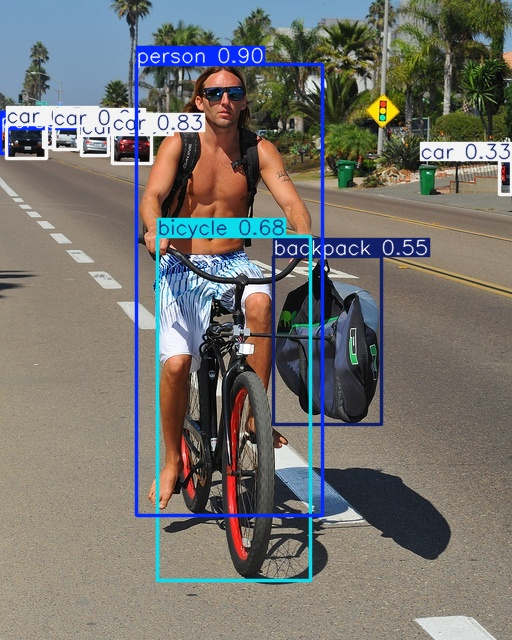

In [25]:
from PIL import Image
Image.open(f'/content/results/results19.jpg')

看來對於真實資料預測非常準確，那麼對於偽裝資料又會表現如何?

In [ ]:
def predict_and_save(model, img_path, dest):
  # Run batched inference on a list of images
  results = model(img_path)  # return a list of Results objects

  # create a directory to save file
  if not os.path.exists(dest):
      os.makedirs(dest)

  # Visualize the results
  for i, r in enumerate(results):
      # Plot results image
      im_bgr = r.plot()  # BGR-order numpy array
      im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image

      # Show results to screen (in supported environments)
      r.show()

      # Save results to disk
      r.save(filename=f"{dest}/results{i}.jpg")

In [ ]:
!unzip demo_obstacle.zip
!unzip demo_obstacle2.zip

Archive:  demo_obstacle.zip
   creating: demo_obstacle/
   creating: demo_obstacle/000000000064_jpg/
  inflating: demo_obstacle/000000000064_jpg/sample_00000.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00001.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00002.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00003.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00004.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00005.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00006.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00007.png  
  inflating: demo_obstacle/000000000064_jpg/sample_00008.png  
   creating: demo_obstacle/000000000074_jpg/
  inflating: demo_obstacle/000000000074_jpg/grid-0000.png  
  inflating: demo_obstacle/000000000074_jpg/sample_00000.png  
  inflating: demo_obstacle/000000000074_jpg/sample_00001.png  
  inflating: demo_obstacle/000000000074_jpg/sample_00002.png  
  inflating: demo_obstacle/00000000007

In [ ]:
from ultralytics import YOLO
import os
from PIL import Image

src_folder = ['demo_obstacle', 'demo_obstacle2']
dest_folder = ['results_obstacle', 'results_obstacle2']

model = YOLO("yolo11n.pt")  # pretrained YOLO11n model

for i in range(len(src_folder)):
    src_path = src_folder[i]
    dest_path = dest_folder[i]
    # get subdirectory
    subdirs = [subdir for subdir in os.listdir(src_path) if os.path.isdir(os.path.join(src_path, subdir))]
    for j in range(len(subdirs)):
        subdir = subdirs[j]
        src_subdir = os.path.join(src_path, subdir)
        dest_subdir = os.path.join(dest_path, subdir)
        images = os.listdir(src_subdir)
        source = [src_subdir + '/' + img for img in images]
        predict_and_save(model, source, dest_subdir)

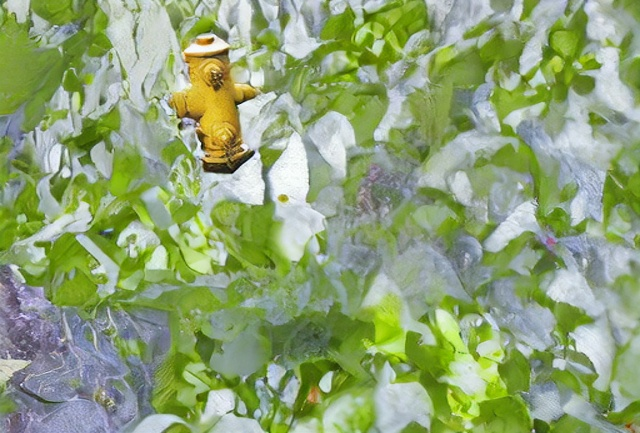

In [28]:
# Prediction FAIL
from PIL import Image
Image.open(f'/content/results_obstacle2/000000042366_jpg/results3.jpg')

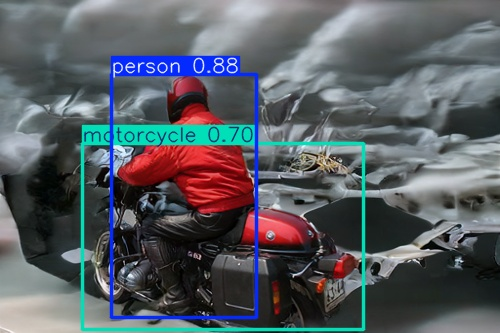

In [30]:
# Prediction Success
from PIL import Image
Image.open(f'/content/results_obstacle/001903_jpg/results2.jpg')

Test on pretrained model
* 基於預測框判斷正確的準確率: 0.7533
* 基於 Ground truth 的準確率: 0.5267

Start Finetune on pretrained model

In [ ]:
!unzip camo_obstacles_v5_3.zip

Archive:  camo_obstacles_v5_3.zip
   creating: camo_obstacles_v5_3/
  inflating: camo_obstacles_v5_3/data.yaml  
   creating: camo_obstacles_v5_3/my_test/
  inflating: camo_obstacles_v5_3/my_test/bicycle2_6_jpg.rf.01a6aabc16673e6c496258b50859fe68.jpg  
  inflating: camo_obstacles_v5_3/my_test/bicycle2_7_jpg.rf.79409f9a4ef0548cf0c4981c36e18a13.jpg  
  inflating: camo_obstacles_v5_3/my_test/bicycle3_4_jpg.rf.b96817ed8f45e211488fb5d1f657db37.jpg  
  inflating: camo_obstacles_v5_3/my_test/bicycle_1_jpg.rf.d97ec986a48220f42bc102a3fb4c0ea3.jpg  
  inflating: camo_obstacles_v5_3/my_test/bicycle_2_jpg.rf.1a0ec6cd83e4ba44bf3c3a7570151861.jpg  
  inflating: camo_obstacles_v5_3/my_test/dog_2_jpg.rf.542d3e70788869a109fdff38577928b9.jpg  
  inflating: camo_obstacles_v5_3/my_test/fire_hydrant_4_jpg.rf.2a65f4a9a34c30aae48837ed08612258.jpg  
   creating: camo_obstacles_v5_3/pre_trained_checkpoints/
  inflating: camo_obstacles_v5_3/pre_trained_checkpoints/yolo11n-seg.pt  
  inflating: camo_obstacles_v5

In [ ]:
#@title Select YOLO11 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['TensorBoard', 'Weights & Biases']

if logger == 'TensorBoard':
  !yolo settings tensorboard=True
  %load_ext tensorboard
  %tensorboard --logdir .
elif logger == 'Weights & Biases':
  !yolo settings wandb=True

✅ Updated 'tensorboard=True'
JSONDict("/root/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": false,
  "vscode_msg": true,
  "openvino_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


<IPython.core.display.Javascript object>

In [ ]:
# train YOLO11 detect
!yolo train model=yolo11n.pt data=/content/camo_obstacles_v5_3/data.yaml epochs=50 imgsz=640

Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/camo_obstacles_v5_3/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, 

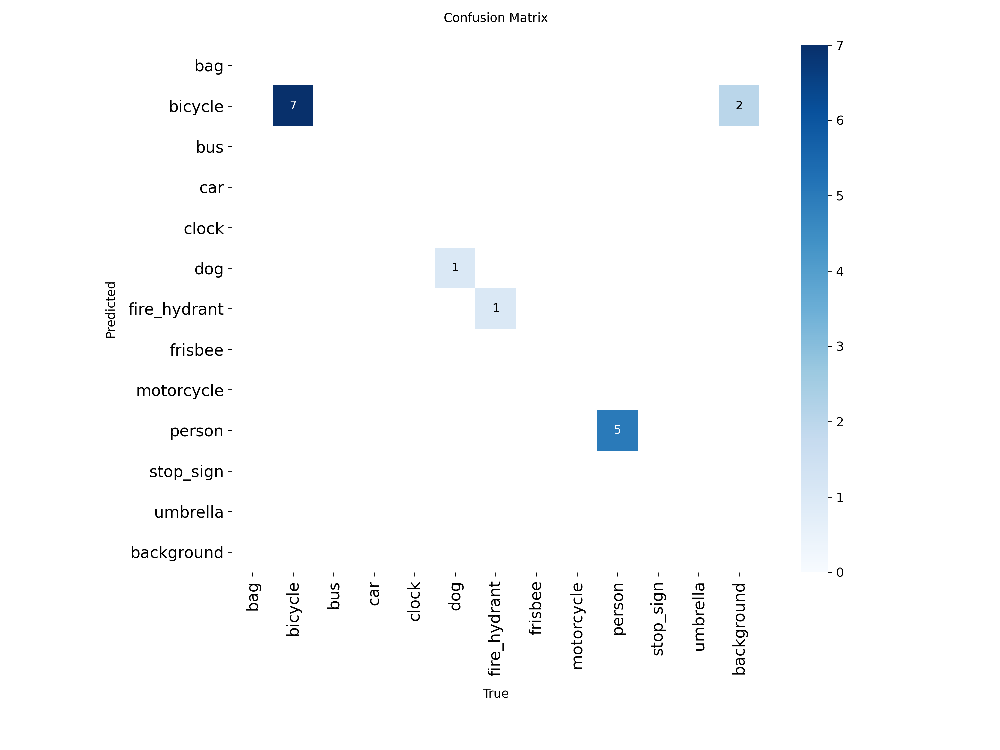

In [ ]:
from PIL import Image
HOME = '/content'
Image.open(f'{HOME}/runs/detect/train/confusion_matrix.png')

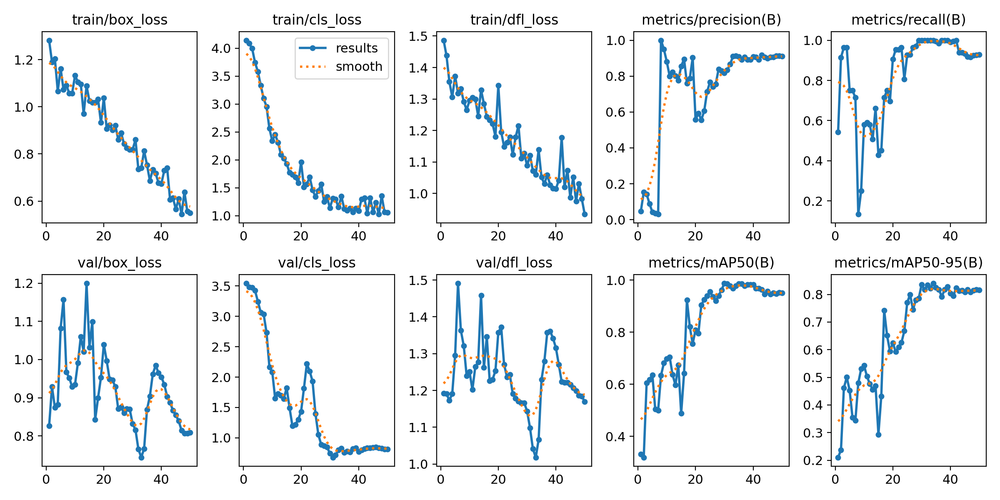

In [ ]:
from PIL import Image
HOME = '/content'
Image.open(f'{HOME}/runs/detect/train/results.png')

In [ ]:
# valiate
!yolo val model=yolo11n.pt data=/content/camo_obstacles_v5_3/data.yaml model=runs/detect/train/weights/best.pt

Ultralytics 8.3.177 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,584,492 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1800.3±604.2 MB/s, size: 50.7 KB)
val: Scanning /content/camo_obstacles_v5_3/valid/labels.cache... 7 images, 0 backgrounds, 0 corrupt: 100% 7/7 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  3.01it/s]
                   all          7         14      0.914          1      0.977       0.84
               bicycle          6          7       0.87          1      0.924       0.66
                   dog          1          1       0.91          1      0.995      0.995
          fire_hydrant          1          1      0.907          1      0.995      0.895
                person          4          5      0.967          1      0.995       0.81
Speed: 0.3ms preprocess, 9.9ms inference, 0.0ms loss, 

Visualization

In [ ]:
from ultralytics import YOLO
import os
from PIL import Image

src_folder = ['demo_obstacle', 'demo_obstacle2']
dest_folder = ['ft_results_obstacle', 'ft_results_obstacle2']

model = YOLO("runs/detect/train/weights/best.pt")  # pretrained YOLO11n model

for i in range(len(src_folder)):
    src_path = src_folder[i]
    dest_path = dest_folder[i]
    # get subdirectory
    subdirs = [subdir for subdir in os.listdir(src_path) if os.path.isdir(os.path.join(src_path, subdir))]
    for j in range(len(subdirs)):
        subdir = subdirs[j]
        src_subdir = os.path.join(src_path, subdir)
        dest_subdir = os.path.join(dest_path, subdir)
        images = os.listdir(src_subdir)
        source = [src_subdir + '/' + img for img in images]
        predict_and_save(model, source, dest_subdir)

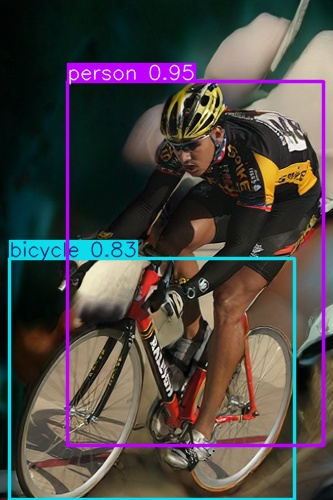

In [21]:
from PIL import Image
Image.open(f'/content/ft_results_obstacle/000305_jpg/results3.jpg')

Test on finetuned model
* 基於預測框判斷正確的準確率: 0.8936
* 基於 Ground truth 的準確率: 0.8462